<a href="https://colab.research.google.com/github/itsmeayushipanday/Data-Augmentation-Using-DeepLearning/blob/main/Data_Augmentation_Using_DeepLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**DATA AUGMENTATION USING DEEP LEARNING**

IMPORTING LIBRARIES

In [3]:
import numpy as np
import urllib # making HTTP request
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras import layers
AUTOTUNE = tf.data.experimental.AUTOTUNE
!pip install tensorflow_docs
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_datasets as tfds
import PIL.Image
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 5)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.6/183.6 kB 3.6 MB/s eta 0:00:00


IMAGE FOR AUGMENTATION

2125399/2125399 [==============================] - 0s 0us/step


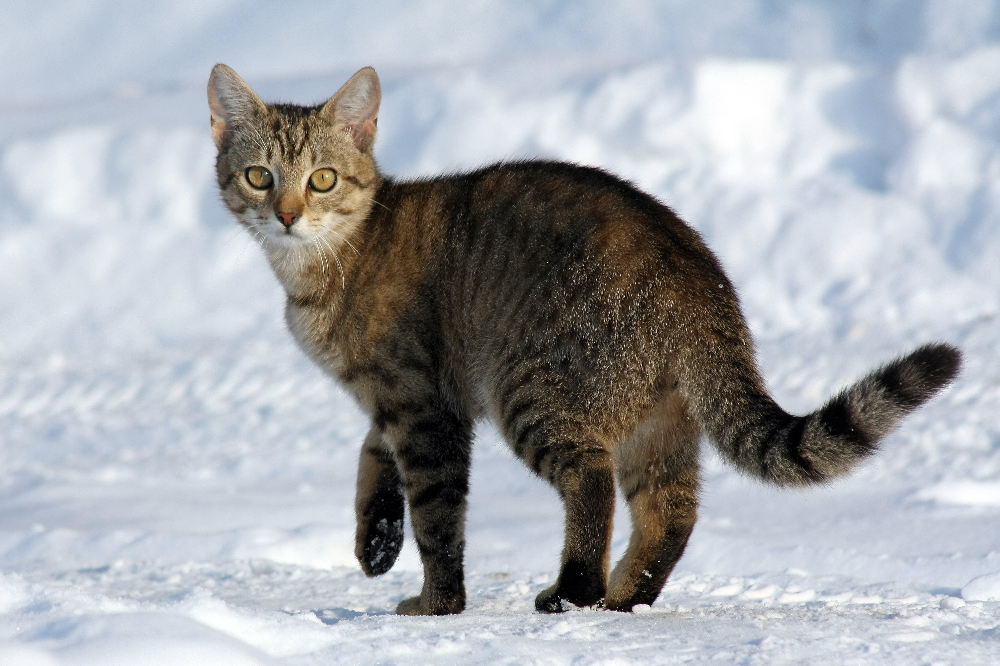

In [7]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/b/b6/Felis_catus-cat_on_snow.jpg"
image_path = tf.keras.utils.get_file('Felis_catus-cat_on_snow.jpg', origin=image_url)
PIL.Image.open(image_path)

READ AND DECODE THE ABOVE IMAGE IN THE FORM OF TENSOR

In [8]:
image_string = tf.io.read_file(image_path)
image = tf.image.decode_jpeg(image_string, channels=3)

COMPARISON BETWEEN ORIGINAL IMAGE AND AUGMENTED IMAGE

In [9]:
def visualize(original, augmented):
  fig = plt.figure()
  plt.subplot(1,2,1)
  plt.title('Original Image')
  plt.imshow(original)

  plt.subplot(1,2,2)
  plt.title('Augmented Image')
  plt.imshow(augmented)

DATA AUGMENTATION ON A SINGLE IMAGE

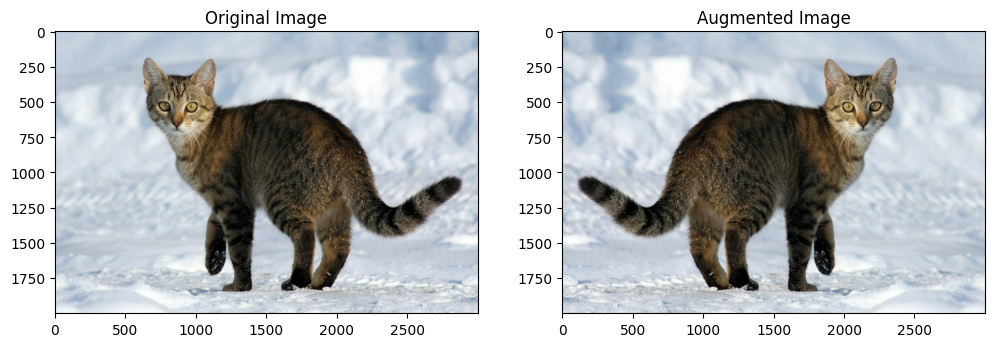

In [10]:
flipped = tf.image.flip_left_right(image)
visualize(image, flipped)

APPLYING GRAY-SCALE FEATURES TO IMAGE

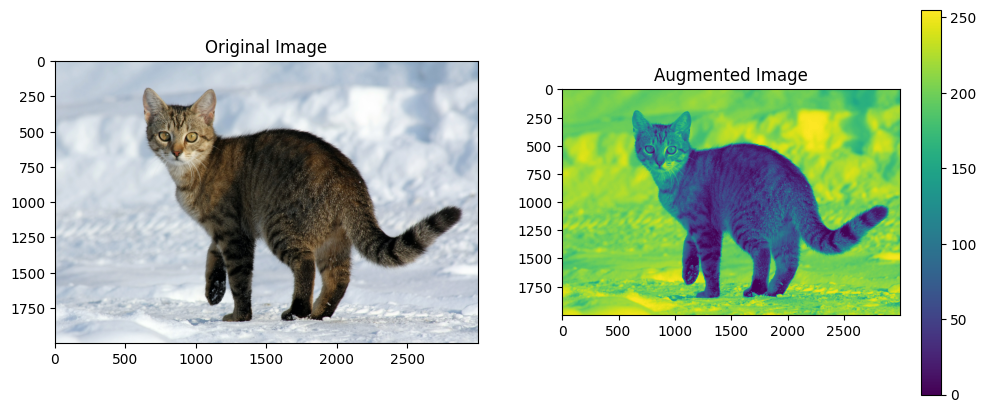

In [11]:
grayscaled = tf.image.rgb_to_grayscale(image)
visualize(image, tf.squeeze(grayscaled))
plt.colorbar()

ADDING SATURATION FACTOR TO THE IMAGE

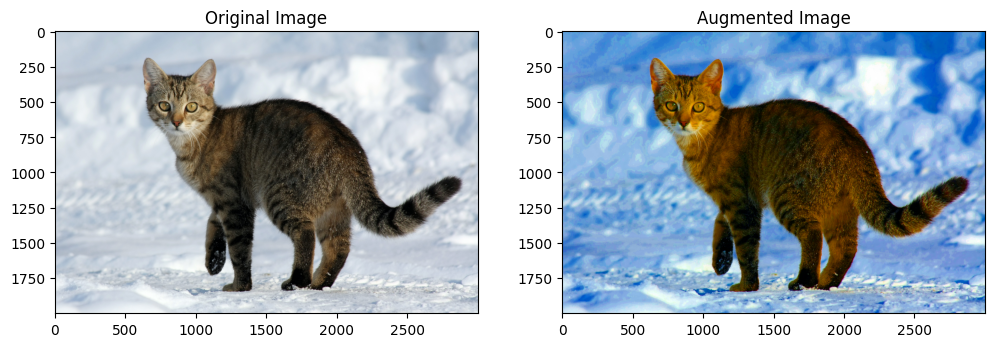

In [13]:
saturated = tf.image.adjust_saturation(image, 5)
visualize(image, saturated)

ADDING BRIGHTNESS TO THE IMAGE

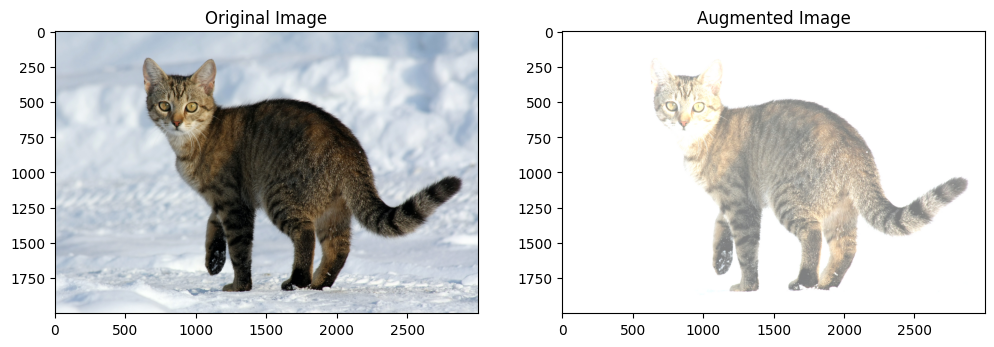

In [15]:
bright = tf.image.adjust_brightness(image, 0.5)
visualize(image, bright)

ROTATING IMAGE BY 90 DEGREE

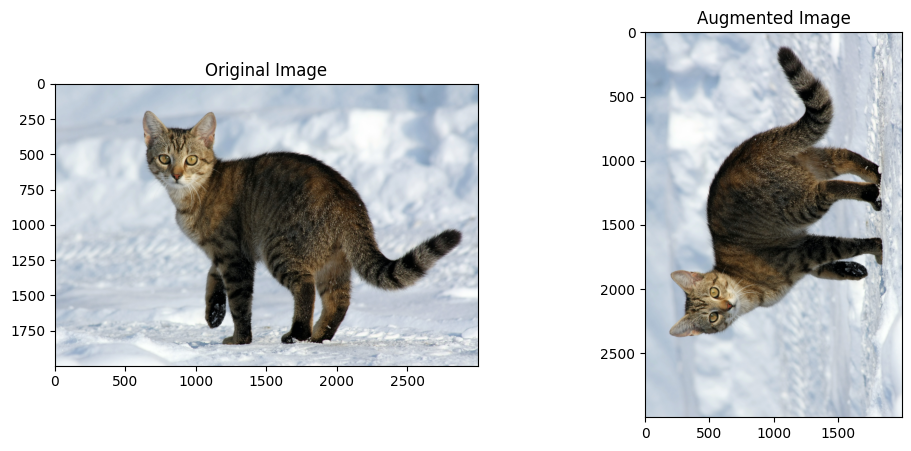

In [16]:
rotated = tf.image.rot90(image)
visualize(image, rotated)

CROPPING THE IMAGE

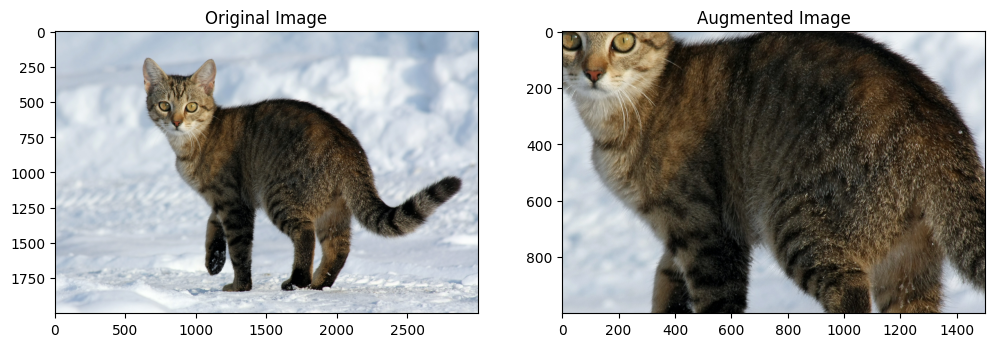

In [17]:
cropped = tf.image.central_crop(image, central_fraction=0.5)
visualize(image, cropped)

DATA AUGMENTATION ON A DATASET AND A TRAINING MODEL

In [18]:
dataset, info = tfds.load('mnist', as_supervised=True, with_info = True)
train_dataset, test_dataset = dataset['train'], dataset['test']
num_train_examples = info.splits['train'].num_examples

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset mnist downloaded and prepared to /root/tensorflow_datasets/mnist/3.0.1. Subsequent calls will reuse this data.


FUNCTION TO AUGMENT THE IMAGE IN THE DATASET

In [19]:
def convert(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32) # normalize its pixel values to the range [0, 1]
  return image, label

def augment(image, label):
  image, label = convert(image, label)
  image = tf.image.convert_image_dtype(image, tf.float32) # normalize its pixel values to the range [0, 1]
  image = tf.image.resize_with_crop_or_pad(image, 34, 34) #adds 6 pixels of padding to each side of the image, resulting in a larger image of size 34x34.
  image = tf.image.random_crop(image, size=[28,28,1]) #performs a random crop to reduce the image back to its original size of 28x28.
  image = tf.image.random_brightness(image, max_delta=0.5)
  return image, label

BATCH_SIZE=64
#use a subset of the data so it's easier to overfit
NUM_EXAMPLES = 2048

CREATING AN AUGMENTED DATASET

In [20]:
augmented_train_batches = (
    train_dataset.take(NUM_EXAMPLES)
    .cache().shuffle(num_train_examples//4)
    .map(augment, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE).prefetch(AUTOTUNE)
)

CREATING A NON-AUGMENTED DATASET

In [21]:
non_augmented_train_batches = (
    train_dataset.take(NUM_EXAMPLES)
    .cache().shuffle(num_train_examples//4)
    .map(convert, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE).prefetch(AUTOTUNE)
)

SETTING UP A VALIDATION SET UP

In [22]:
validation_batches = (
    test_dataset.map(convert, num_parallel_calls=AUTOTUNE).batch(2*BATCH_SIZE)
)

CREATING A FULLY CONNECTED NEURAL NETWORK MODEL WITH TWO LAYERS AND COMPILING  

In [25]:
def make_model():
  model = tf.keras.Sequential([
      layers.Flatten(input_shape=(28,28,1)),
      layers.Dense(4096, activation='relu'),
      layers.Dense(4096, activation='relu'),
      layers.Dense(10)
  ])
  model.compile(optimizer = 'adam',
                loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  return model

TRAINIG DATA WITHOUT DATA AUGMENTATION

In [26]:
model_without_aug = make_model()
no_aug_history = model_without_aug.fit(non_augmented_train_batches, epochs=50, validation_data=validation_batches)

Epoch 1/50
32/32 [==============================] - 38s 1s/step - loss: 0.7798 - accuracy: 0.7617 - val_loss: 0.3063 - val_accuracy: 0.9086
Epoch 2/50
32/32 [==============================] - 45s 1s/step - loss: 0.1758 - accuracy: 0.9473 - val_loss: 0.3929 - val_accuracy: 0.8882
Epoch 3/50
32/32 [==============================] - 32s 991ms/step - loss: 0.0785 - accuracy: 0.9771 - val_loss: 0.3096 - val_accuracy: 0.9202
Epoch 4/50
32/32 [==============================] - 41s 1s/step - loss: 0.0351 - accuracy: 0.9893 - val_loss: 0.3373 - val_accuracy: 0.9209
Epoch 5/50
32/32 [==============================] - 46s 1s/step - loss: 0.0205 - accuracy: 0.9927 - val_loss: 0.4015 - val_accuracy: 0.9122
Epoch 6/50
32/32 [==============================] - 43s 1s/step - loss: 0.0297 - accuracy: 0.9873 - val_loss: 0.4054 - val_accuracy: 0.9150
Epoch 7/50
32/32 [==============================] - 27s 867ms/step - loss: 0.0451 - accuracy: 0.9839 - val_loss: 0.4719 - val_accuracy: 0.9049
Epoch 8/50
32/

TRAINING MODEL WITH AUGMENTATION

In [27]:
model_with_aug = make_model()
aug_history = model_with_aug.fit(augmented_train_batches, epochs=50, validation_data=validation_batches)

Epoch 1/50
32/32 [==============================] - 38s 1s/step - loss: 2.3484 - accuracy: 0.3164 - val_loss: 1.2396 - val_accuracy: 0.6002
Epoch 2/50
32/32 [==============================] - 36s 1s/step - loss: 1.4596 - accuracy: 0.5171 - val_loss: 0.7493 - val_accuracy: 0.7977
Epoch 3/50
32/32 [==============================] - 36s 1s/step - loss: 0.9825 - accuracy: 0.6636 - val_loss: 0.5437 - val_accuracy: 0.8357
Epoch 4/50
32/32 [==============================] - 36s 1s/step - loss: 0.7634 - accuracy: 0.7451 - val_loss: 0.4147 - val_accuracy: 0.8702
Epoch 5/50
32/32 [==============================] - 26s 835ms/step - loss: 0.7116 - accuracy: 0.7656 - val_loss: 0.3700 - val_accuracy: 0.8905
Epoch 6/50
32/32 [==============================] - 36s 1s/step - loss: 0.6048 - accuracy: 0.8081 - val_loss: 0.3411 - val_accuracy: 0.8989
Epoch 7/50
32/32 [==============================] - 36s 1s/step - loss: 0.5869 - accuracy: 0.8135 - val_loss: 0.3075 - val_accuracy: 0.9073
Epoch 8/50
32/32 

In [28]:
#Augmented dataset produces accuracy which is greater than that produced by Non Augmented dataset

(0.75, 1.0)

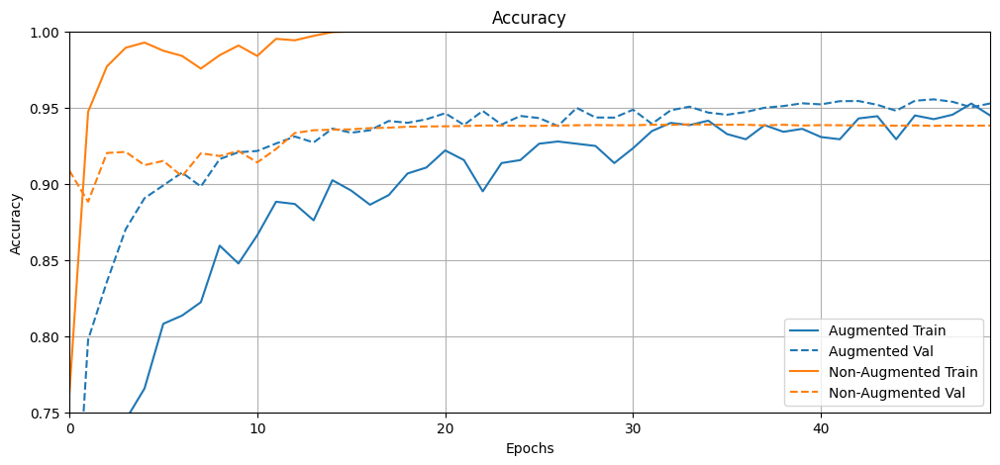

In [29]:
plotter = tfdocs.plots.HistoryPlotter()
plotter.plot({"Augmented": aug_history, "Non-Augmented": no_aug_history}, metric = 'accuracy')
plt.title("Accuracy")
plt.ylim([0.75,1])